In [1]:
#python imports (i suggest you download anaconda to run this notebook)
import numpy as np
import matplotlib.pyplot as plt

from scipy import signal
from scipy.io import wavfile
from IPython.display import Audio

#Utility function for dB scaling of magnitude spectra
def sig2db(mag_spec):
    return 20*np.log10(mag_spec)

%matplotlib inline

In [7]:
fs, original_sound = wavfile.read('azaleaTown.wav') #please change the filename to your specified audio...
if len(original_sound.shape) > 1: 
    original_sound = original_sound.mean(axis = 1) #if the wav file is originally stereo, this makes it mono (one channel)
print(f"Sampling rate is {fs} Hz")

Sampling rate is 48000 Hz


In [8]:
Audio(data=original_sound, rate=fs) #this will play the audio for you

Text(0.5, 0, 't')

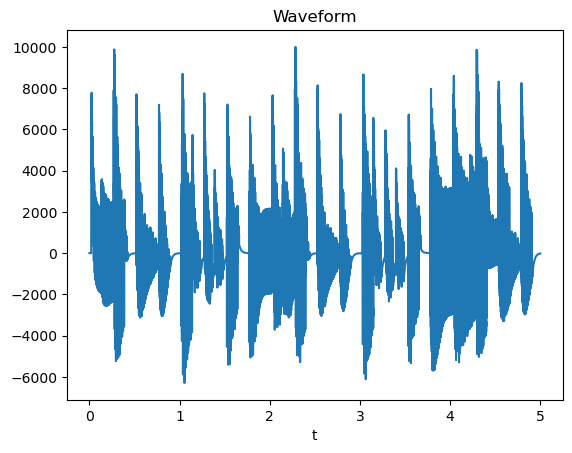

In [ ]:
startTime = 0 #specify the start time of your sample
stopTime = 5 #specify the stop time of your sample
soundClip = original_sound[int(fs*startTime):int(fs*stopTime)] #now we have spliced the specified time interval...

#Plotted below is your sound sample's waveform
plt.figure()
plt.plot(np.linspace(startTime,stopTime,len(soundClip)), soundClip)
plt.title("Waveform")
plt.xlabel("t") 

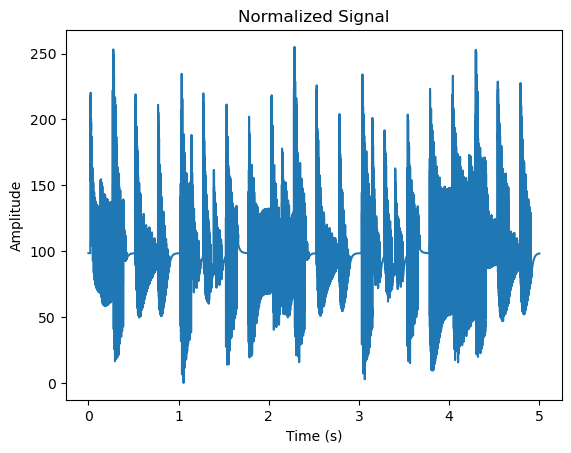

Offset applied: 6291.0
NewClip range: Min=0.0, Max=255.0


In [12]:
#Now we will format the sound clip to work with PWM 
# 1) We will offset the waveform to make sure no negative values are present
# 2) We will squeeze the values to be within a certain range of values (for 8 bit representation we make sure all values are between 0 to 255)

# Convert to float for processing
newClip = soundClip.astype(np.float64)

# 1) Apply offset to make all values positive
offset = np.abs(np.min(newClip))
newClip += offset

# 2) Normalize to a certain bit range (please keep in mind that high bit ranges will take up significantly more memory)
bit_range = 8 #this will make sure the audio is within 8 bit range. Increase this number it for higher quality audio. 
max_range_value = (2**8) - 1
newClip = (newClip / np.max(newClip)) * (max_range_value)


# Plotted below is the formatted data
plt.figure()
plt.plot(np.linspace(startTime, stopTime, len(newClip)), newClip)
plt.title("Normalized Signal")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()
# Debug information
print(f"Offset applied: {offset}")
print(f"NewClip range: Min={np.min(newClip)}, Max={np.max(newClip)}")


In [13]:
#this will save all the values in the above graph into a text file... this is how we quickly store these values since there is so many
np.savetxt("audio_data_text.txt", newClip, fmt="%d") #we make sure every sample is captures as an INTEGER (since we can't do fractional representations)

In [15]:
# Now we will convert the formatted audio data into a usable COE file for use in BRAM instantiation in Vivado
# **Just run this cell, there is nothing to change here...

txt_filename = "audio_data_text.txt"  # Input .txt file with integer values
coe_filename = "audio_data.coe"  # Output .coe file

def closest_power_of_2(x):
    """Returns the smallest power of 2 greater than or equal to x."""
    return 1 if x == 0 else 2 ** (x - 1).bit_length()

# Read the integer values from the .txt file
with open(txt_filename, "r") as txt_file:
    int_values = [int(line.strip()) for line in txt_file.readlines()]

# Calculate BRAM parameters
read_depth = len(int_values)  # Total entries rounded to power of 2
data_width = max(int_values).bit_length()  # Number of bits needed to represent the largest value

# Convert integers to hexadecimal strings
hex_values = [f"{value:02x}" for value in int_values]

# Write the .coe file
with open(coe_filename, "w") as coe_file:
    coe_file.write("memory_initialization_radix=16;\n")  # Use hexadecimal radix
    coe_file.write("memory_initialization_vector=\n")
    coe_file.write(",\n".join(hex_values) + ";\n")  # Write values separated by commas

# Read the Print statements as they have important configuration data for your BRAM instantiation
print(f"BRAM Configuration:")
print(f"  Read Depth: {read_depth}")
print(f"  Data Width: {data_width} bits")
print(f"COE file saved as {coe_filename}")


BRAM Configuration:
  Read Depth: 240000
  Data Width: 8 bits
COE file saved as audio_data.coe
